In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the measured ground-truth data
csv_path = './3D-Data/Measured/gnd_n=50_noise=0.0.csv'
df = pd.read_csv(csv_path)

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook', palette='deep')

# Create a pairplot: scatter on off-diagonals, KDE on diagonals
pair_grid = sns.pairplot(
    df,
    diag_kind='kde',          # kernel density estimate on diagonal
    corner=False,             # show full matrix
    plot_kws={
        'alpha': 0.6,
        's': 40
    },
    diag_kws={
        'shade': True
    }
)

# Add a main title
pair_grid.fig.suptitle(
    'Pairplot of Measured 3D Data (n=50, noise=0.0)',
    y=1.02,
    fontsize=16
)

# Adjust layout and display
plt.tight_layout()
plt.show()


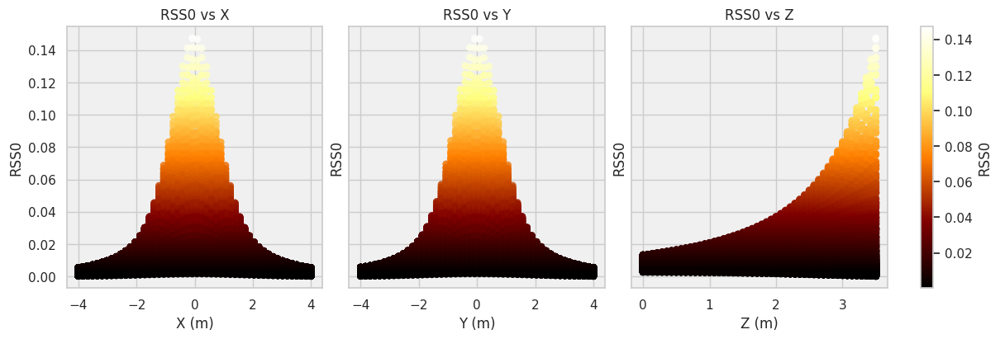

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

# Load the measured ground-truth data
csv_path = './3D-Data/Measured/gnd_n=50_noise=0.0.csv'
df = pd.read_csv(csv_path)

# Select only the desired columns and drop missing values
df = df[['RSS0', 'X', 'Y', 'Z']].dropna()

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Variables to plot against RSS0
vars = ['X', 'Y', 'Z']

# Create subplots with constrained layout for proper colorbar placement
fig, axes = plt.subplots(
    1, len(vars),
    figsize=(len(vars) * 4, 4),
    sharey=True,
    constrained_layout=True
)

# Normalize for consistent colormap across plots
norm = plt.Normalize(
    df['RSS0'].min(),
    df['RSS0'].max()
)
# Create a ScalarMappable for the colorbar
sm = cm.ScalarMappable(cmap='afmhot', norm=norm)
sm.set_array([])

# Plot each scatter
for ax, var in zip(axes, vars):
    ax.set_facecolor('#f0f0f0')  # light grey background
    sc = ax.scatter(
        df[var], df['RSS0'],
        c=df['RSS0'],
        cmap='afmhot',
        norm=norm,
        s=40,
        alpha=0.6,
        edgecolors='none'
    )
    ax.set_xlabel(f"{var} (m)")
    ax.set_ylabel('RSS0')
    ax.set_title(f'RSS0 vs {var}')

# Add shared colorbar on the right
# Save the figure as SVG

cbar = fig.colorbar(
    sm,
    ax=axes,
    label='RSS0',
    fraction=0.046,
    pad=0.04
)
fig.savefig("rss0_vs_xyz.png", format="png", dpi=1200)

plt.show()


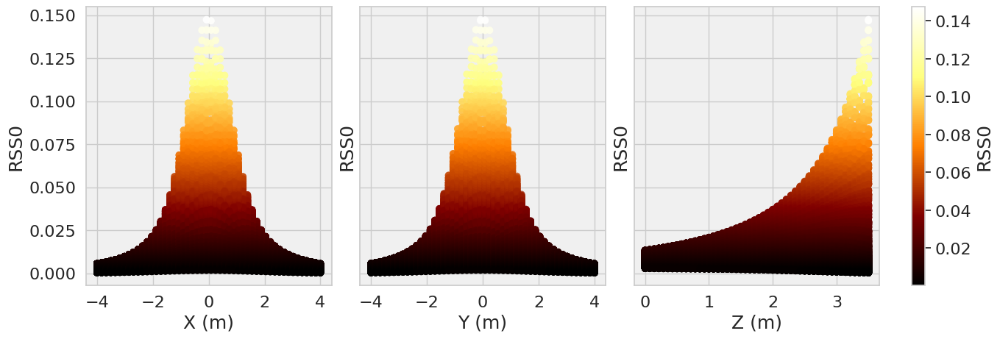

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

# Load the measured ground-truth data
csv_path = './3D-Data/Measured/gnd_n=50_noise=0.0.csv'
df = pd.read_csv(csv_path)

# Select only the desired columns and drop missing values
df = df[['RSS0', 'X', 'Y', 'Z']].dropna()

# Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Font sizes for publication
LABEL_FONTSIZE = 18
TICK_FONTSIZE = 16
CBAR_FONTSIZE = 18

# Variables to plot against RSS0
vars = ['X', 'Y', 'Z']

# Create subplots
fig, axes = plt.subplots(
    1, len(vars),
    figsize=(len(vars) * 4.5, 4.5),
    sharey=True,
    constrained_layout=True
)

# Normalize for consistent colormap across plots
norm = plt.Normalize(df['RSS0'].min(), df['RSS0'].max())

# ScalarMappable for shared colorbar
sm = cm.ScalarMappable(cmap='afmhot', norm=norm)
sm.set_array([])

# Plot each scatter
for ax, var in zip(axes, vars):
    ax.set_facecolor('#f0f0f0')

    ax.scatter(
        df[var], df['RSS0'],
        c=df['RSS0'],
        cmap='afmhot',
        norm=norm,
        s=50,
        alpha=0.7,
        edgecolors='none'
    )

    ax.set_xlabel(f"{var} (m)", fontsize=LABEL_FONTSIZE)
    ax.set_ylabel("RSS0", fontsize=LABEL_FONTSIZE)

    ax.tick_params(axis='both', labelsize=TICK_FONTSIZE)

# Add shared colorbar
cbar = fig.colorbar(
    sm,
    ax=axes,
    fraction=0.046,
    pad=0.04
)
cbar.set_label("RSS0", fontsize=CBAR_FONTSIZE)
cbar.ax.tick_params(labelsize=TICK_FONTSIZE)

# Save figure
fig.savefig("rss0_vs_xyz2.png", format="png", dpi=1200)

plt.show()


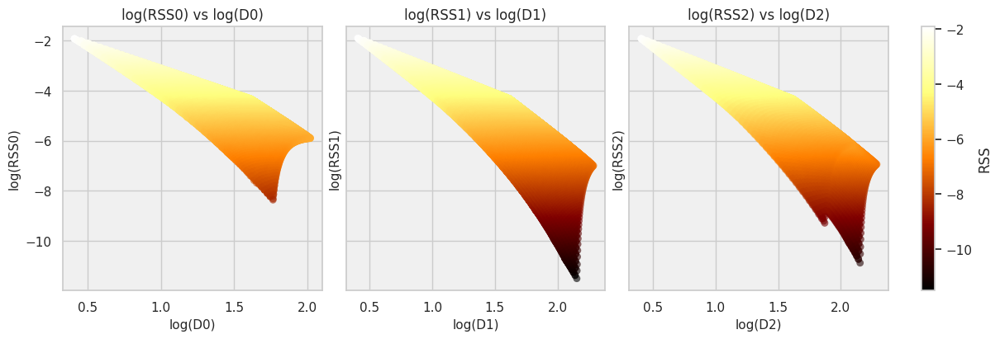

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import matplotlib.cm as cm

# Load the measured ground-truth data (standard scaled)
csv_path = './3D-Data/Measured_log_d_Normalized/gnd_n=50_noise=0.0.csv'
df_scaled = pd.read_csv(csv_path)

# Load the fitted StandardScaler to reverse the scaling
with open('./scaler_log_d.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Inverse transform the data and rename columns with log() notation
renamed_columns = [f"log({col})" for col in df_scaled.columns]
df_unscaled = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=renamed_columns)

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Columns of interest
pairs = [(f"log(RSS{i})", f"log(D{i})") for i in range(3)]

# Normalize for consistent colormap across plots
rss_vals = df_unscaled[[pair[0] for pair in pairs]].values.flatten()
norm = plt.Normalize(rss_vals.min(), rss_vals.max())
sm = cm.ScalarMappable(norm=norm, cmap='afmhot')
sm.set_array([])

# Create subplots with constrained layout for proper colorbar placement
fig, axes = plt.subplots(
    1, 3,
    figsize=(12, 4),
    sharey=True,
    constrained_layout=True
)

# Plot each scatter
for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')  # light grey background
    sc = ax.scatter(
        df_unscaled[d_col], df_unscaled[rss_col],
        c=df_unscaled[rss_col], cmap='afmhot', norm=norm,
        s=40, alpha=0.6, edgecolors='none'
    )
    ax.set_xlabel(f"{d_col}", fontsize=11)
    ax.set_ylabel(f"{rss_col}", fontsize=11)
    ax.set_title(f'{rss_col} vs {d_col}', fontsize=12)

# Add shared colorbar on the right
cbar = fig.colorbar(
    sm,
    ax=axes,
    label='RSS',
    fraction=0.046,
    pad=0.04
)

# Save the figure as SVG and PNG

fig.savefig("rss_vs_d_log_scaled.png", format="png", dpi=300)

plt.show()


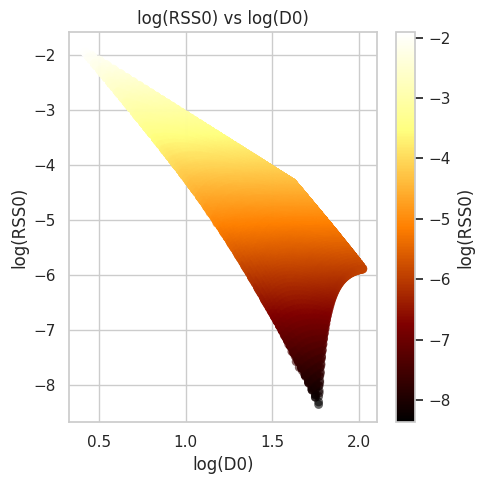

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import matplotlib.cm as cm

# Load the measured ground-truth data (standard scaled)
csv_path = './3D-Data/Measured_log_d_Normalized/gnd_n=50_noise=0.0.csv'
df_scaled = pd.read_csv(csv_path)

# Load the fitted StandardScaler to reverse the scaling
with open('./scaler_log_d.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Inverse transform the data and rename columns with log() notation
renamed_columns = [f"log({col})" for col in df_scaled.columns]
df_unscaled = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=renamed_columns)

# Filter only the columns of interest
x_col = "log(D0)"
y_col = "log(RSS0)"

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook', palette='deep')

# Prepare colormap normalization
norm = plt.Normalize(df_unscaled[y_col].min(), df_unscaled[y_col].max())
sm = cm.ScalarMappable(norm=norm, cmap='afmhot')
sm.set_array([])

# Create a single scatter plot
fig, ax = plt.subplots(figsize=(5, 5))
sc = ax.scatter(
    df_unscaled[x_col], df_unscaled[y_col],
    c=df_unscaled[y_col], cmap='afmhot', norm=norm,
    s=40, alpha=0.6, edgecolors='none'
)
ax.set_xlabel(x_col)
ax.set_ylabel(y_col)
ax.set_title(f'{y_col} vs {x_col}')

# Add colorbar
cbar = fig.colorbar(sm, ax=ax, label=y_col)

plt.tight_layout()
plt.show()


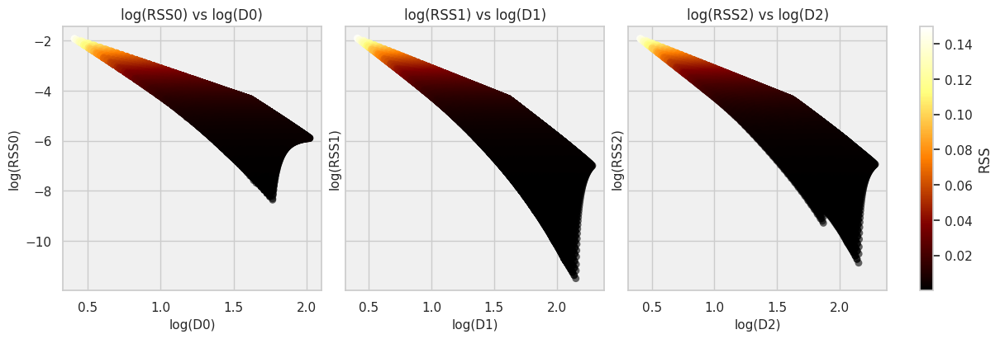

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import matplotlib.cm as cm

# Load the measured ground-truth data (standard scaled)
csv_path = './3D-Data/Measured_log_d_Normalized/gnd_n=50_noise=0.0.csv'
df_scaled = pd.read_csv(csv_path)

# Load the fitted StandardScaler to reverse the scaling
with open('./scaler_log_d.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Inverse transform the data and rename columns with log() notation
renamed_columns = [f"log({col})" for col in df_scaled.columns]
df_unscaled = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=renamed_columns)

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Columns of interest
pairs = [(f"log(RSS{i})", f"log(D{i})") for i in range(3)]

# Normalize for consistent colormap based on actual RSS values
rss_log_vals = df_unscaled[[pair[0] for pair in pairs]].values.flatten()
rss_vals = np.exp(rss_log_vals)
norm = plt.Normalize(rss_vals.min(), rss_vals.max())
sm = cm.ScalarMappable(norm=norm, cmap='afmhot')
sm.set_array([])

# Create subplots with constrained layout for proper colorbar placement
fig, axes = plt.subplots(
    1, 3,
    figsize=(12, 4),
    sharey=True,
    constrained_layout=True
)

# Plot each scatter
for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')  # light grey background
    sc = ax.scatter(
        df_unscaled[d_col], df_unscaled[rss_col],
        c=np.exp(df_unscaled[rss_col]), cmap='afmhot', norm=norm,
        s=40, alpha=0.6, edgecolors='none'
    )
    ax.set_xlabel(f"{d_col}", fontsize=11)
    ax.set_ylabel(f"{rss_col}", fontsize=11)
    ax.set_title(f'{rss_col} vs {d_col}', fontsize=12)

# Add shared colorbar on the right
cbar = fig.colorbar(
    sm,
    ax=axes,
    label='RSS',
    fraction=0.046,
    pad=0.04
)

# Save the figure as SVG and PNG

fig.savefig("rss_vs_d_log_scaled.png", format="png", dpi=1200)

plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import numpy as np
import matplotlib.cm as cm

# Load the measured ground-truth data (standard scaled)
csv_path = './3D-Data/Measured_log_d_Normalized/gnd_n=50_noise=0.0.csv'
df_scaled = pd.read_csv(csv_path)

# Load the fitted StandardScaler to reverse the scaling
with open('./scaler_log_d.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Inverse transform the data and rename columns with log() notation
renamed_columns = [f"log({col})" for col in df_scaled.columns]
df_unscaled = pd.DataFrame(
    scaler.inverse_transform(df_scaled),
    columns=renamed_columns
)

# Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Font sizes for publication (same as previous figure)
LABEL_FONTSIZE = 18
TICK_FONTSIZE = 16
CBAR_FONTSIZE = 18

# Columns of interest
pairs = [(f"log(RSS{i})", f"log(D{i})") for i in range(3)]

# Normalize for consistent colormap based on actual RSS values
rss_log_vals = df_unscaled[[pair[0] for pair in pairs]].values.flatten()
rss_vals = np.exp(rss_log_vals)

norm = plt.Normalize(rss_vals.min(), rss_vals.max())
sm = cm.ScalarMappable(norm=norm, cmap='afmhot')
sm.set_array([])

# Create subplots
fig, axes = plt.subplots(
    1, 3,
    figsize=(3 * 4.5, 4.5),
    sharey=True,
    constrained_layout=True
)

# Plot each scatter
for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')

    ax.scatter(
        df_unscaled[d_col],
        df_unscaled[rss_col],
        c=np.exp(df_unscaled[rss_col]),
        cmap='afmhot',
        norm=norm,
        s=50,
        alpha=0.7,
        edgecolors='none'
    )

    ax.set_xlabel(d_col, fontsize=LABEL_FONTSIZE)
    ax.set_ylabel(rss_col, fontsize=LABEL_FONTSIZE)

    ax.tick_params(axis='both', labelsize=TICK_FONTSIZE)

# Add shared colorbar
cbar = fig.colorbar(
    sm,
    ax=axes,
    fraction=0.046,
    pad=0.04
)
cbar.set_label("RSS", fontsize=CBAR_FONTSIZE)
cbar.ax.tick_params(labelsize=TICK_FONTSIZE)

# Save figure
fig.savefig("rss_vs_d_log_scaled.png", format="png", dpi=1200)

plt.show()


/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill

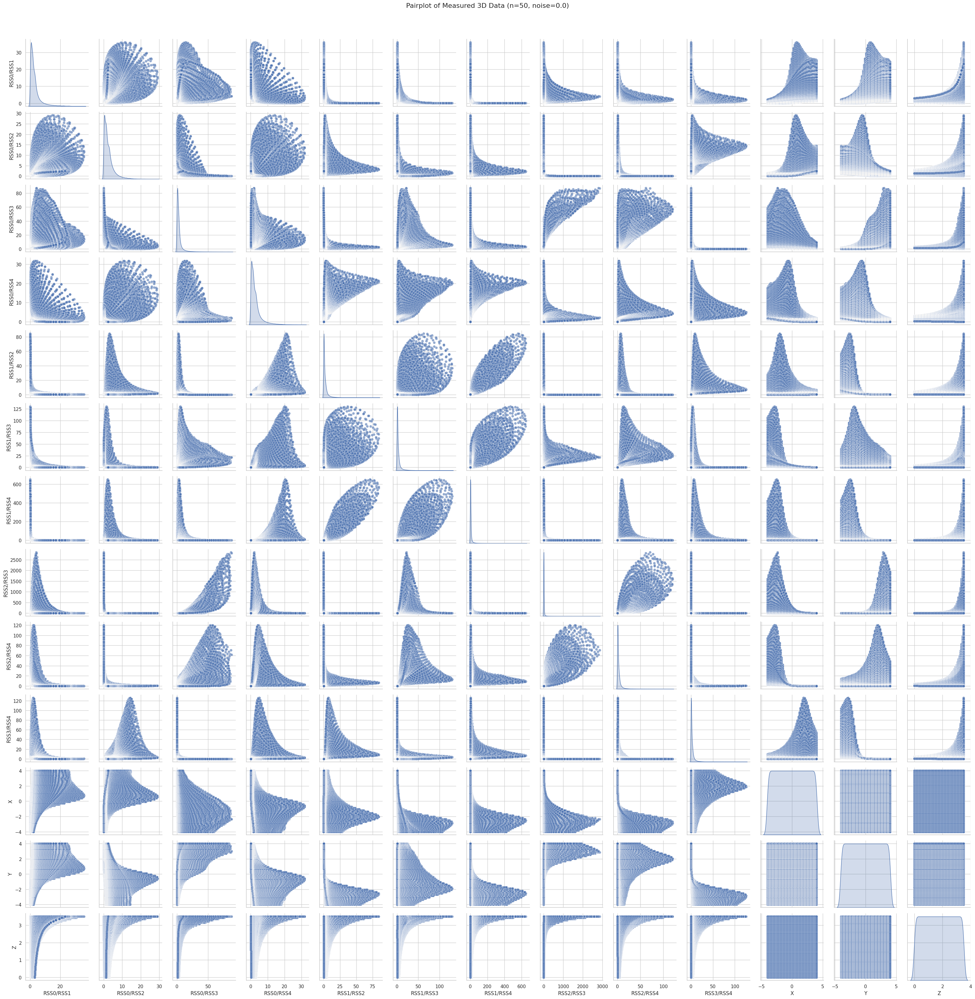

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the measured ground-truth data
csv_path = './3D-Data/Measured_relative/relative_gnd_n=50_noise=0.0.csv'

df = pd.read_csv(csv_path)

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook', palette='deep')

# Create a pairplot: scatter on off-diagonals, KDE on diagonals
pair_grid = sns.pairplot(
    df,
    diag_kind='kde',          # kernel density estimate on diagonal
    corner=False,             # show full matrix
    plot_kws={
        'alpha': 0.6,
        's': 40
    },
    diag_kws={
        'shade': True
    }
)

# Add a main title
pair_grid.fig.suptitle(
    'Pairplot of Measured 3D Data (n=50, noise=0.0)',
    y=1.02,
    fontsize=16
)

# Adjust layout and display
plt.tight_layout()
plt.show()


/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/home/sumo/anikraft/vs-code/.conda/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill

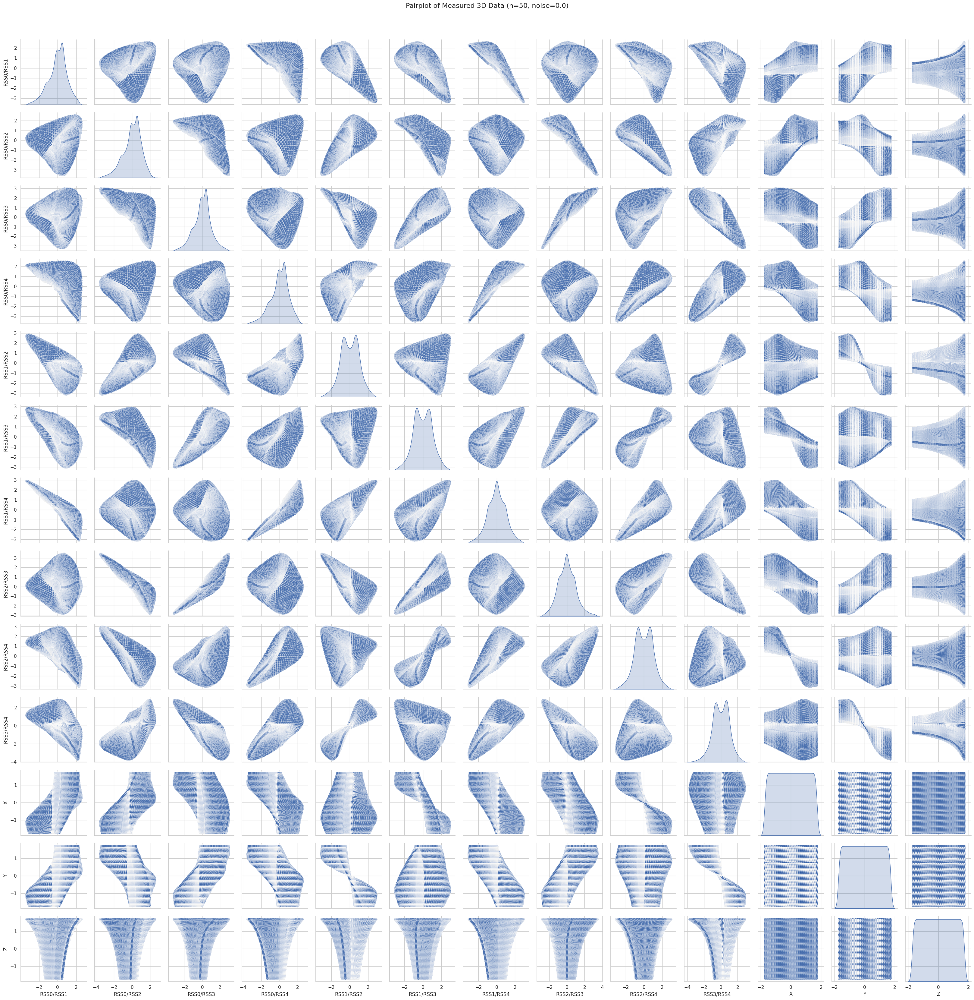

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the measured ground-truth data
csv_path = './3D-Data/Measured_relative_Normalized/relative_gnd_n=50_noise=0.0.csv'

df = pd.read_csv(csv_path)

# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook', palette='deep')

# Create a pairplot: scatter on off-diagonals, KDE on diagonals
pair_grid = sns.pairplot(
    df,
    diag_kind='kde',          # kernel density estimate on diagonal
    corner=False,             # show full matrix
    plot_kws={
        'alpha': 0.6,
        's': 40
    },
    diag_kws={
        'shade': True
    }
)

# Add a main title
pair_grid.fig.suptitle(
    'Pairplot of Measured 3D Data (n=50, noise=0.0)',
    y=1.02,
    fontsize=16
)

# Adjust layout and display
plt.tight_layout()
plt.show()


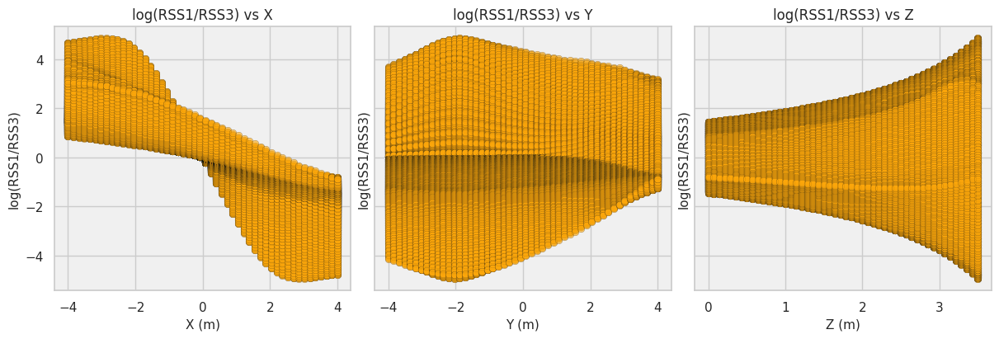

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Load the relative measured data
import pickle

with open('./scaler_relative.pkl', 'rb') as f:
    scaler = pickle.load(f)

# Read and inverse transform the data
df_scaled = pd.read_csv(csv_path)
df = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=df_scaled.columns)


# Set up Seaborn aesthetics
sns.set(style='whitegrid', context='notebook')

# Columns of interest
pairs = [("RSS1/RSS3", axis) for axis in ["X", "Y", "Z"]]


# Create subplots with constrained layout for proper colorbar placement
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True, constrained_layout=True)

# Plot each scatter
for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')  # light grey background
    sc = ax.scatter(
        df[d_col], df[rss_col],
        c=[[252/255, 167/255, 10/255]],
        s=40, alpha=0.6, edgecolors='k', linewidths=0.2
    )
    ax.set_xlabel(f"{d_col} (m)", fontsize=11)
    ax.set_ylabel("log(RSS1/RSS3)", fontsize=11)
    ax.set_title(f'log(RSS1/RSS3) vs {d_col}', fontsize=12)

# Save the figure as PNG
fig.savefig("rss1_div_rss3_vs_xyz.png", format="png", dpi=1200)

plt.show()


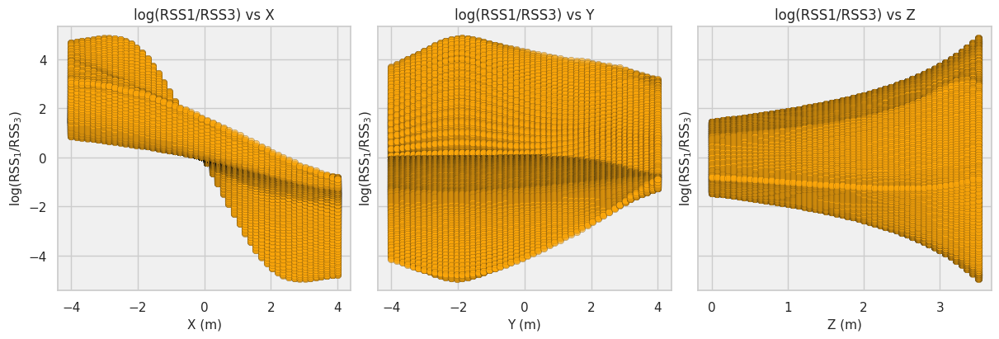

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle

# ---------- data ----------
with open('./scaler_relative.pkl', 'rb') as f:
    scaler = pickle.load(f)

csv_path = './3D-Data/Measured_relative_Normalized/relative_gnd_n=50_noise=0.0.csv'
df_scaled = pd.read_csv(csv_path)
df = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=df_scaled.columns)

# ---------- look & feel ----------
sns.set(style='whitegrid', context='notebook')
pairs = [("RSS1/RSS3", axis) for axis in ["X", "Y", "Z"]]

fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True,
                         constrained_layout=True)

for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')
    ax.scatter(
        df[d_col], df[rss_col],
        c=[[252/255, 167/255, 10/255]],
        s=40, alpha=0.6,
        edgecolors='k', linewidths=0.2,
        rasterized=True                 # <-- key line: keeps style, shrinks file
    )
    ax.set_xlabel(f"{d_col} (m)", fontsize=11)
    ax.set_ylabel(r"$\log(\mathrm{RSS}_1/\mathrm{RSS}_3)$", fontsize=11)
    ax.set_title(f"log(RSS1/RSS3) vs {d_col}", fontsize=12)

# ---------- save tiny versions ----------
# (1) Hybrid PDF – crisp text/axes, scatter baked at 300 dpi
fig.savefig("rss1_div_rss3_vs_xyz.pdf",
            dpi=300, bbox_inches='tight')

# (2) PNG – same 300 dpi raster, losslessly optimised
fig.savefig("rss1_div_rss3_vs_xyz.png",
            dpi=300, bbox_inches='tight',
            pil_kwargs={"optimize": True})

plt.show()


In [ ]:

# Create subplots with constrained layout for proper colorbar placement
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True, constrained_layout=True)

# Plot each scatter
for ax, (rss_col, d_col) in zip(axes, pairs):
    ax.set_facecolor('#f0f0f0')  # light grey background
    sc = ax.scatter(
        df[d_col], df[rss_col],
        c=[[252/255, 167/255, 10/255]],
        s=40, alpha=0.6, edgecolors='k', linewidths=0.2
    )
    ax.set_xlabel(f"{d_col} (m)", fontsize=11)
    ax.set_ylabel("log(RSS1/RSS3)", fontsize=11)
    ax.set_title(f'log(RSS1/RSS3) vs {d_col}', fontsize=12)

# Save the figure as PNG
fig.savefig("rss1_div_rss3_vs_xyz.png", format="png", dpi=1200)

plt.show()
